<a href="https://www.kaggle.com/code/sagunbastola/data-analysis-on-years-of-global-major-earthquake?scriptVersionId=290757543" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/200-years-of-global-major-earthquakes-18262026/earthquake1826_2026.csv


In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
earthquake_data=pd.read_csv('/kaggle/input/200-years-of-global-major-earthquakes-18262026/earthquake1826_2026.csv',parse_dates=["time"])

In [4]:
earthquake_data.head()

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,id,updated,place,type,horizontalError,depthError,magError,magNst,status
0,2026-01-07 22:00:13.258000+00:00,-23.4332,-179.8984,547.033,5.5,mww,63.0,39.0,5.976,1.13,us7000rnbi,2026-01-07T22:24:28.537Z,south of the Fiji Islands,earthquake,8.66,7.704,0.093,11.0,reviewed
1,2026-01-07 04:12:56.792000+00:00,7.2863,127.0595,11.854,5.5,mww,58.0,53.0,1.485,1.40,us7000rn4a,2026-01-07T16:31:18.040Z,"53 km E of Santiago, Philippines",earthquake,5.21,4.721,0.098,10.0,reviewed
2,2026-01-07 03:02:56.040000+00:00,7.3902,126.7221,35.000,6.4,mww,118.0,30.0,1.178,1.17,us7000rn2z,2026-01-07T15:50:12.915Z,"16 km ESE of Baculin, Philippines",earthquake,7.94,1.842,0.047,44.0,reviewed
3,2026-01-06 23:10:38.371000+00:00,-17.6276,168.2465,62.384,5.0,mww,47.0,79.0,2.388,0.54,us7000rn1j,2026-01-07T12:59:00.885Z,"13 km NNW of Port-Vila, Vanuatu",earthquake,9.64,6.266,0.103,9.0,reviewed
4,2026-01-06 19:17:09.696000+00:00,37.2523,74.6137,10.000,5.2,mb,112.0,54.0,1.991,0.88,us7000rmzt,2026-01-07T05:04:55.711Z,"103 km N of Barishal, Pakistan",earthquake,6.54,1.848,0.049,136.0,reviewed


In [5]:
earthquake_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106077 entries, 0 to 106076
Data columns (total 19 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   time             106077 non-null  object 
 1   latitude         106077 non-null  float64
 2   longitude        106077 non-null  float64
 3   depth            105484 non-null  float64
 4   mag              106077 non-null  float64
 5   magType          106077 non-null  object 
 6   nst              31347 non-null   float64
 7   gap              41986 non-null   float64
 8   dmin             21402 non-null   float64
 9   rms              74560 non-null   float64
 10  id               106077 non-null  object 
 11  updated          106077 non-null  object 
 12  place            105855 non-null  object 
 13  type             106077 non-null  object 
 14  horizontalError  19983 non-null   float64
 15  depthError       54440 non-null   float64
 16  magError         36554 non-null   floa

In [6]:
earthquake_data.describe()

,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst
count,106077.000000,106077.000000,105484.000000,106077.000000,31347.000000,41986.000000,21402.000000,74560.000000,19983.000000,54440.000000,36554.000000,42353.000000
mean,3.794865,40.265552,61.576360,5.452841,157.568507,63.119420,4.236853,0.960075,7.834729,7.982370,0.171523,54.878497
std,30.328921,121.991382,107.751084,0.485270,126.397291,38.590796,5.211970,0.372130,8.643364,10.727341,0.152104,82.993485
min,-77.080000,-179.997000,-4.000000,5.000000,0.000000,6.500000,0.000000,-1.000000,0.000000,-1.000000,0.000000,0.000000
25%,-17.741000,-72.395000,12.000000,5.100000,68.000000,36.000000,1.271000,0.810000,6.030000,1.977500,0.060000,12.000000
50%,-0.569000,99.069000,33.000000,5.300000,118.000000,54.700000,2.533000,0.970000,7.500000,4.900000,0.100000,27.000000
75%,30.160000,142.820000,50.300000,5.700000,210.000000,80.675000,5.008750,1.100000,9.200000,9.600000,0.210000,61.000000
max,87.386000,180.000000,700.000000,9.500000,934.000000,360.000000,41.046000,69.320000,778.000000,1091.900000,1.840000,1027.000000


In [7]:
earthquake_data.isna().sum()

time                   0
latitude               0
longitude              0
depth                593
mag                    0
magType                0
nst                74730
gap                64091
dmin               84675
rms                31517
id                     0
updated                0
place                222
type                   0
horizontalError    86094
depthError         51637
magError           69523
magNst             63724
status                 0
dtype: int64

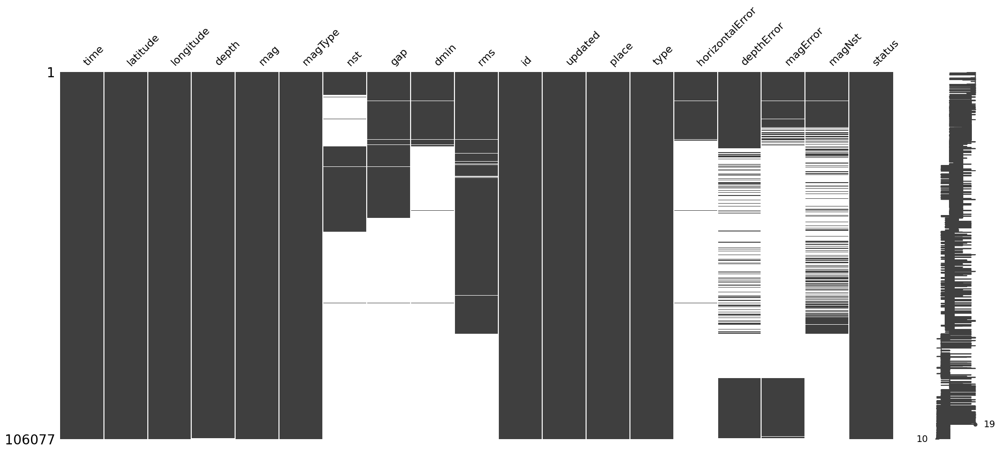

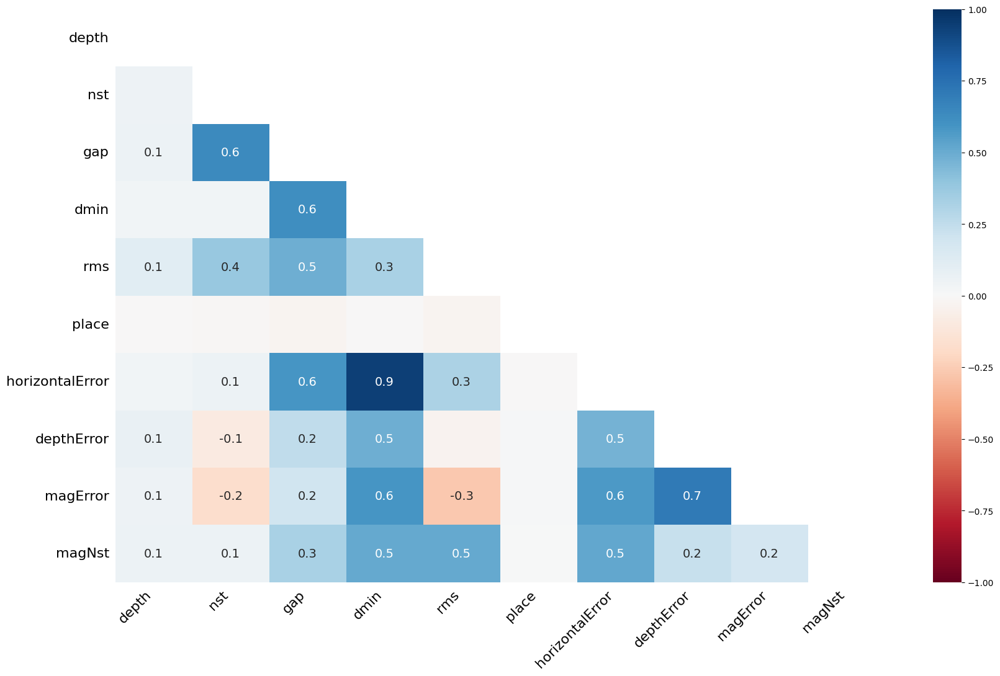

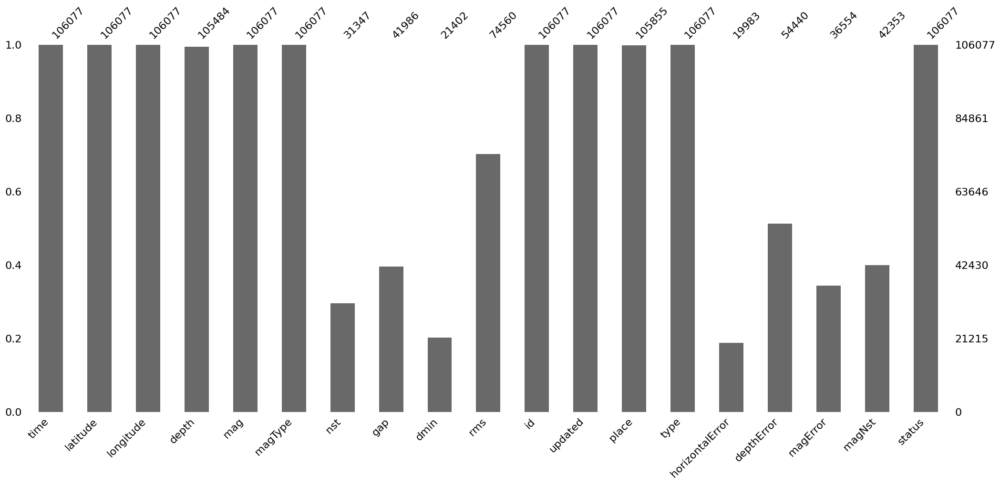

In [8]:
import missingno as msno
import matplotlib.pyplot as plt
msno.matrix(earthquake_data)
plt.show()
msno.heatmap(earthquake_data)
plt.show()

msno.bar(earthquake_data)
plt.show()

In [9]:
earthquake_data["time"] = pd.to_datetime(
    earthquake_data["time"],
    format="ISO8601",
    utc=True
)

In [10]:
earthquake_data["year"]=earthquake_data["time"].dt.year
earthquake_year=pd.DataFrame(earthquake_data.groupby("year")["year"].value_counts())
earthquake_year

,count
year,
1827,1
1830,1
1832,1
1834,1
1836,1
...,...
2022,1726
2023,1780
2024,1507


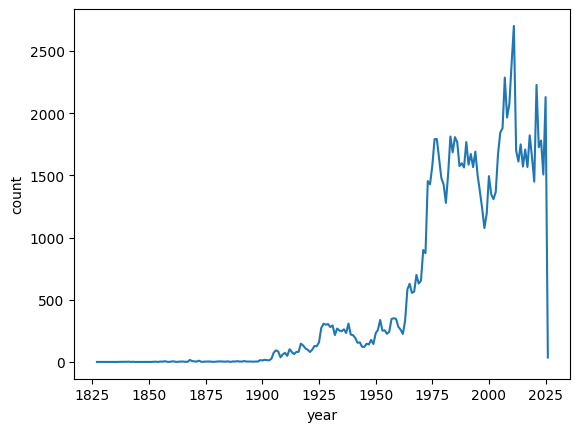

In [11]:
g=sns.lineplot(data=earthquake_year,x=earthquake_year.index,y="count")
g.set(xlabel="year",ylabel="count")
plt.show()

In [12]:
threshold=len(earthquake_data)*0.01

In [13]:
cols_to_drop=earthquake_data.columns[earthquake_data.isna().sum()<=threshold]

In [14]:
cols_to_drop

Index(['time', 'latitude', 'longitude', 'depth', 'mag', 'magType', 'id',
       'updated', 'place', 'type', 'status', 'year'],
      dtype='object')

In [15]:
earthquake_data.dropna(inplace=True,subset=cols_to_drop)

In [16]:
earthquake_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 105262 entries, 0 to 106062
Data columns (total 20 columns):
 #   Column           Non-Null Count   Dtype              
---  ------           --------------   -----              
 0   time             105262 non-null  datetime64[ns, UTC]
 1   latitude         105262 non-null  float64            
 2   longitude        105262 non-null  float64            
 3   depth            105262 non-null  float64            
 4   mag              105262 non-null  float64            
 5   magType          105262 non-null  object             
 6   nst              31248 non-null   float64            
 7   gap              41840 non-null   float64            
 8   dmin             21348 non-null   float64            
 9   rms              74345 non-null   float64            
 10  id               105262 non-null  object             
 11  updated          105262 non-null  object             
 12  place            105262 non-null  object             
 13  type

In [17]:
earthquake_data.describe()

,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst,year
count,105262.000000,105262.000000,105262.000000,105262.000000,31248.000000,41840.000000,21348.000000,74345.000000,19927.000000,54345.000000,36502.000000,42282.000000,105262.000000
mean,3.642360,41.257093,61.559661,5.451343,157.708909,63.112944,4.227273,0.960070,7.726035,7.987293,0.171671,54.835746,1991.792375
std,30.277673,121.660614,107.689486,0.483646,126.477046,38.599609,5.199244,0.372503,4.490027,10.734200,0.152157,82.964103,24.366962
min,-77.080000,-179.997000,-4.000000,5.000000,0.000000,6.500000,0.000000,-1.000000,0.000000,-1.000000,0.000000,0.000000,1843.000000
25%,-17.776750,-71.936750,12.000000,5.100000,68.000000,36.000000,1.269750,0.810000,6.025000,2.000000,0.060000,12.000000,1978.000000
50%,-0.820550,99.849500,33.000000,5.300000,118.000000,54.700000,2.528000,0.970000,7.500000,4.900000,0.100000,27.000000,1995.000000
75%,29.812500,142.911000,50.300000,5.700000,210.250000,80.600000,5.001000,1.100000,9.200000,9.600000,0.210000,61.000000,2011.000000
max,87.386000,180.000000,700.000000,9.500000,934.000000,360.000000,41.046000,69.320000,99.000000,1091.900000,1.840000,1027.000000,2026.000000


In [18]:
pd.DataFrame(earthquake_data.groupby("mag")["nst"].mean())

,nst
mag,
5.00,98.451879
5.01,34.750000
5.02,19.250000
5.03,19.500000
5.04,21.500000
...,...
8.80,352.500000
9.00,NaN
9.10,571.000000


In [19]:
earthquake_data["nst"] = earthquake_data["nst"].fillna(earthquake_data["nst"].mean())

In [20]:
earthquake_data.isna().sum()

time                   0
latitude               0
longitude              0
depth                  0
mag                    0
magType                0
nst                    0
gap                63422
dmin               83914
rms                30917
id                     0
updated                0
place                  0
type                   0
horizontalError    85335
depthError         50917
magError           68760
magNst             62980
status                 0
year                   0
dtype: int64

In [21]:
earthquake_data["gap"]

0         39.0
1         53.0
2         30.0
3         79.0
4         54.0
          ... 
106021     NaN
106032     NaN
106034     NaN
106055     NaN
106062     NaN
Name: gap, Length: 105262, dtype: float64

In [22]:
m=pd.DataFrame(earthquake_data["gap"].value_counts(bins=[0,45,90,180,np.inf],sort=False))
m

,count
"(-0.001, 45.0]",15989
"(45.0, 90.0]",17659
"(90.0, 180.0]",7647
"(180.0, inf]",545


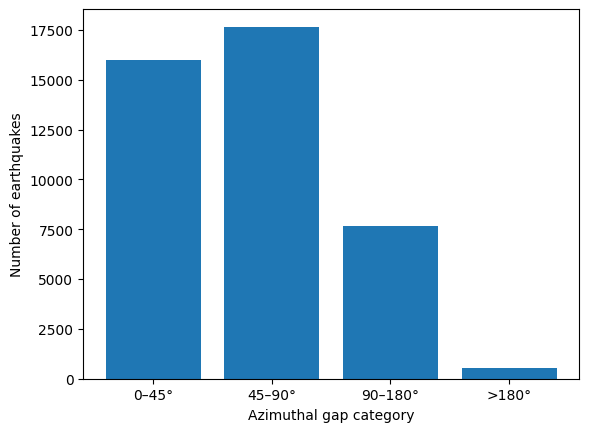

In [23]:
labels = ["0–45°", "45–90°", "90–180°", ">180°"]
plt.bar(x=labels, height=m["count"])
plt.xlabel("Azimuthal gap category")
plt.ylabel("Number of earthquakes")
plt.show()

In [24]:
earthquake_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 105262 entries, 0 to 106062
Data columns (total 20 columns):
 #   Column           Non-Null Count   Dtype              
---  ------           --------------   -----              
 0   time             105262 non-null  datetime64[ns, UTC]
 1   latitude         105262 non-null  float64            
 2   longitude        105262 non-null  float64            
 3   depth            105262 non-null  float64            
 4   mag              105262 non-null  float64            
 5   magType          105262 non-null  object             
 6   nst              105262 non-null  float64            
 7   gap              41840 non-null   float64            
 8   dmin             21348 non-null   float64            
 9   rms              74345 non-null   float64            
 10  id               105262 non-null  object             
 11  updated          105262 non-null  object             
 12  place            105262 non-null  object             
 13  type

In [25]:
m=pd.DataFrame(earthquake_data["dmin"].value_counts(bins=[0.2,5,10,15,20,25,30,35,40,45],sort=False))
m

,count
"(0.199, 5.0]",15549
"(5.0, 10.0]",3490
"(10.0, 15.0]",740
"(15.0, 20.0]",552
"(20.0, 25.0]",196
"(25.0, 30.0]",195
"(30.0, 35.0]",139
"(35.0, 40.0]",25
"(40.0, 45.0]",1


In [26]:
bins = pd.cut(earthquake_data["mag"], bins=[0, 5.5, 6, 7, 10])

earthquake_data["rms"] = (
    earthquake_data
    .groupby(bins)["rms"]
    .transform(lambda x: x.fillna(x.median()))
)

/tmp/ipykernel_24/2912626679.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(bins)["rms"]


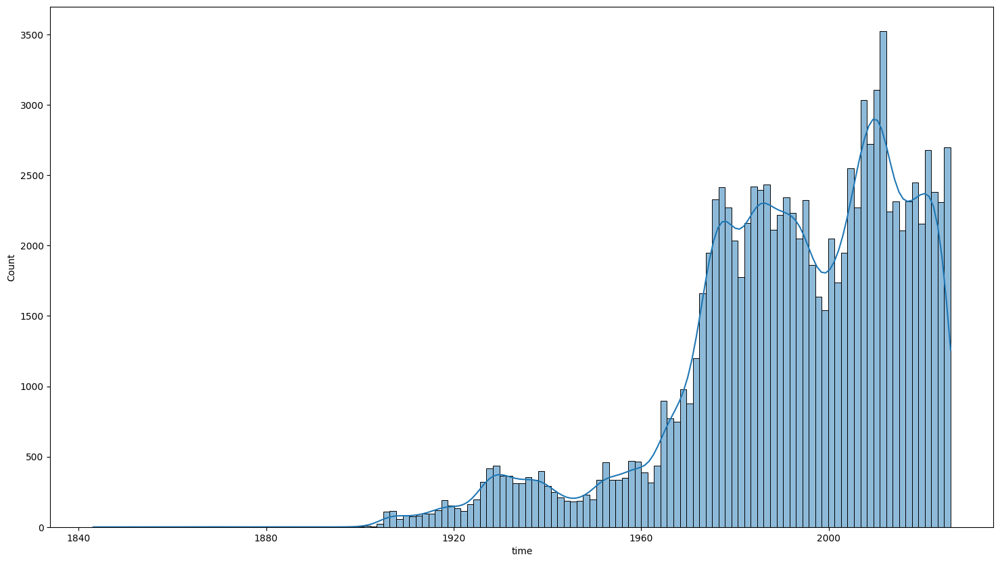

In [27]:
plt.figure(figsize=(18,10))
sns.histplot(data=earthquake_data,x="time",kde=True)
plt.show()

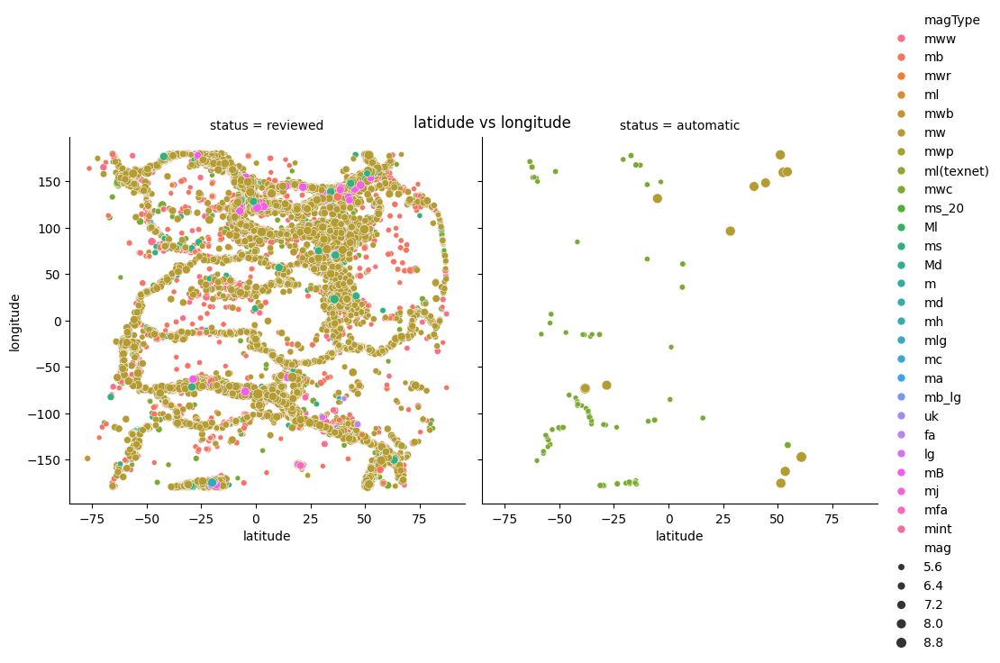

In [28]:
g=sns.relplot(kind="scatter",data=earthquake_data,x="latitude",y="longitude",size="mag",hue="magType",col="status")
g.fig.suptitle("latidude vs longitude")
plt.show()

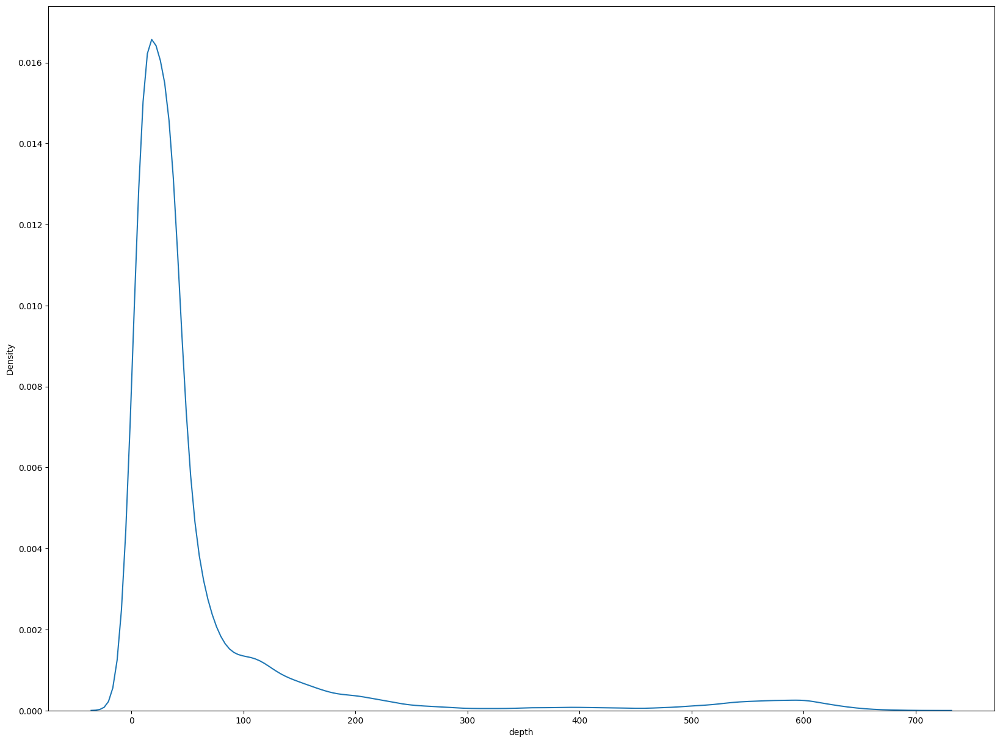

In [29]:
plt.figure(figsize=(20,15))
sns.kdeplot(x="depth",data=earthquake_data)
plt.show()

In [30]:
d= pd.DataFrame(earthquake_data['time'].dt.hour)
d

,time
0,22
1,4
2,3
3,23
4,19
...,...
106021,14
106032,11
106034,3
106055,0


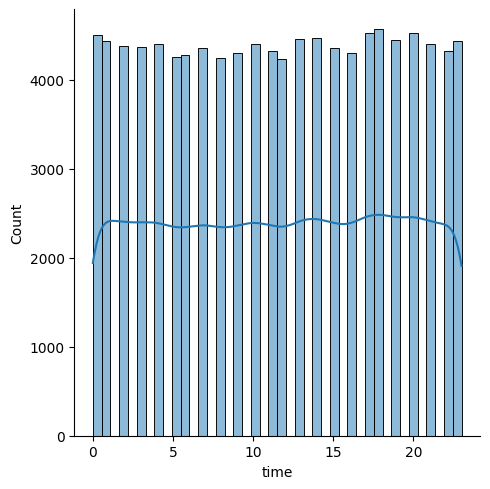

In [31]:
sns.displot(kind="hist",kde=True,data=d,x="time")

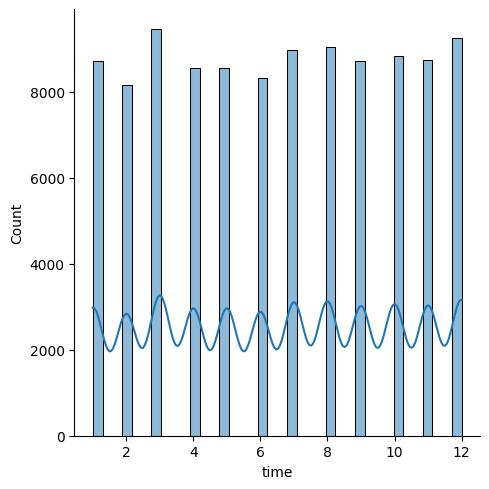

In [32]:
d= pd.DataFrame(earthquake_data['time'].dt.month)
sns.displot(kind="hist",kde=True,data=d,x="time")

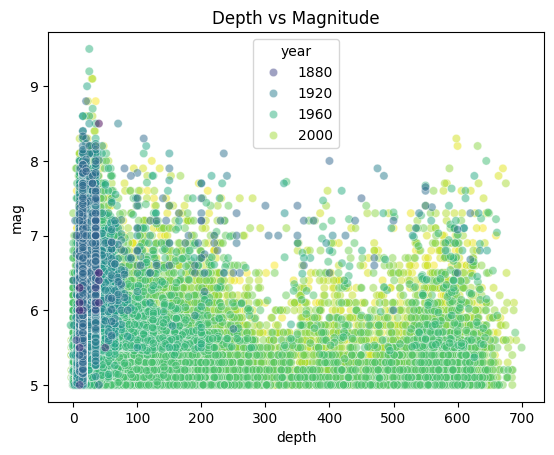

In [33]:
sns.scatterplot(x='depth', y='mag', data=earthquake_data, alpha=0.5,hue='year', palette='viridis')
plt.title("Depth vs Magnitude")
plt.show()

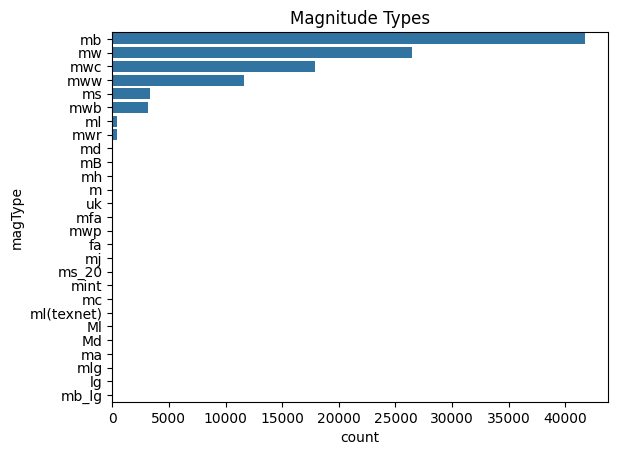

In [34]:
sns.countplot(y='magType', data=earthquake_data, order=earthquake_data['magType'].value_counts().index)
plt.title("Magnitude Types")
plt.show()

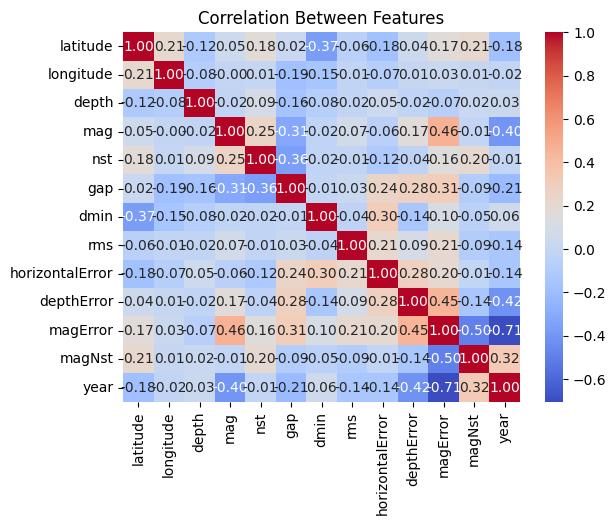

In [35]:
sns.heatmap(earthquake_data.corr(numeric_only=True), annot=True, fmt='.2f', cmap='coolwarm')
plt.title("Correlation Between Features")
plt.show()

In [36]:
earthquake_data["type"].value_counts()

type
earthquake           104750
nuclear explosion       444
volcanic eruption        55
explosion                10
landslide                 1
mine collapse             1
rock burst                1
Name: count, dtype: int64

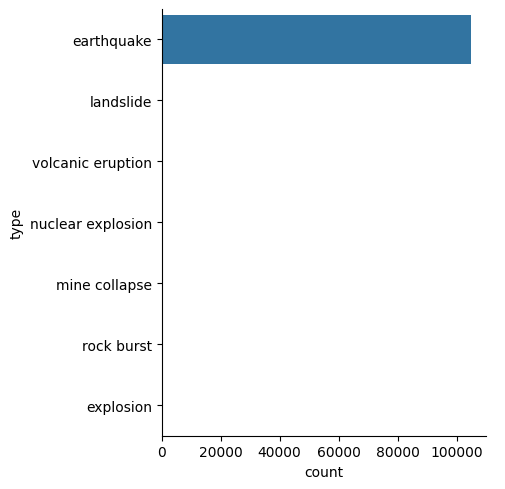

In [37]:
sns.catplot(data=earthquake_data,y="type",kind="count")
plt.show()

In [38]:
#top earthquake location
earthquake_data["place"].value_counts()[:10]

place
South Sandwich Islands region    2416
Kermadec Islands region          1550
south of the Fiji Islands        1443
Kermadec Islands, New Zealand    1080
Fiji region                       931
south of the Kermadec Islands     864
northern Mid-Atlantic Ridge       774
southern Mid-Atlantic Ridge       696
Pacific-Antarctic Ridge           676
Kuril Islands                     670
Name: count, dtype: int64

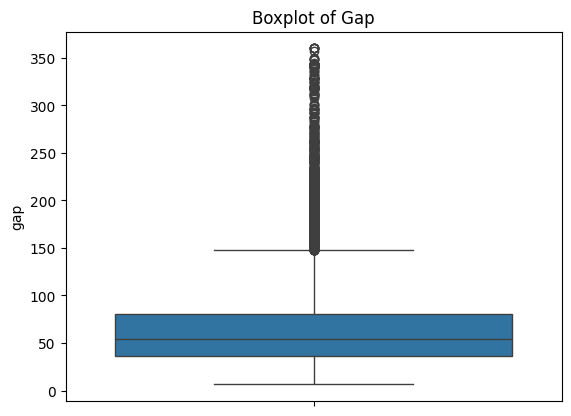

In [39]:
sns.boxplot(y=earthquake_data['gap'])
plt.title("Boxplot of Gap")
plt.show()


<Figure size 3000x2500 with 0 Axes>

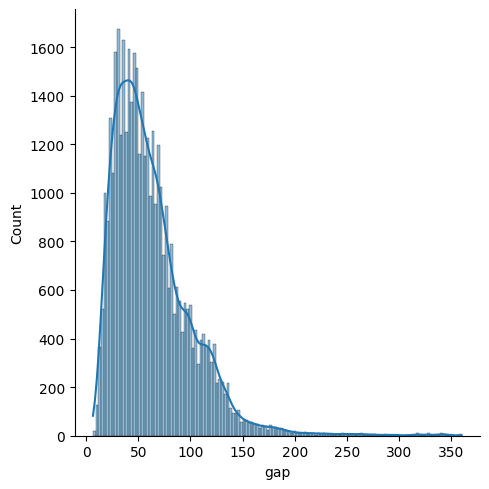

In [40]:
plt.figure(figsize=(30,25))
sns.displot(kind="hist",data=earthquake_data,x="gap",kde=True)
plt.show()

In [41]:
earthquake_data.head()

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,id,updated,place,type,horizontalError,depthError,magError,magNst,status,year
0,2026-01-07 22:00:13.258000+00:00,-23.4332,-179.8984,547.033,5.5,mww,63.0,39.0,5.976,1.13,us7000rnbi,2026-01-07T22:24:28.537Z,south of the Fiji Islands,earthquake,8.66,7.704,0.093,11.0,reviewed,2026
1,2026-01-07 04:12:56.792000+00:00,7.2863,127.0595,11.854,5.5,mww,58.0,53.0,1.485,1.40,us7000rn4a,2026-01-07T16:31:18.040Z,"53 km E of Santiago, Philippines",earthquake,5.21,4.721,0.098,10.0,reviewed,2026
2,2026-01-07 03:02:56.040000+00:00,7.3902,126.7221,35.000,6.4,mww,118.0,30.0,1.178,1.17,us7000rn2z,2026-01-07T15:50:12.915Z,"16 km ESE of Baculin, Philippines",earthquake,7.94,1.842,0.047,44.0,reviewed,2026
3,2026-01-06 23:10:38.371000+00:00,-17.6276,168.2465,62.384,5.0,mww,47.0,79.0,2.388,0.54,us7000rn1j,2026-01-07T12:59:00.885Z,"13 km NNW of Port-Vila, Vanuatu",earthquake,9.64,6.266,0.103,9.0,reviewed,2026
4,2026-01-06 19:17:09.696000+00:00,37.2523,74.6137,10.000,5.2,mb,112.0,54.0,1.991,0.88,us7000rmzt,2026-01-07T05:04:55.711Z,"103 km N of Barishal, Pakistan",earthquake,6.54,1.848,0.049,136.0,reviewed,2026


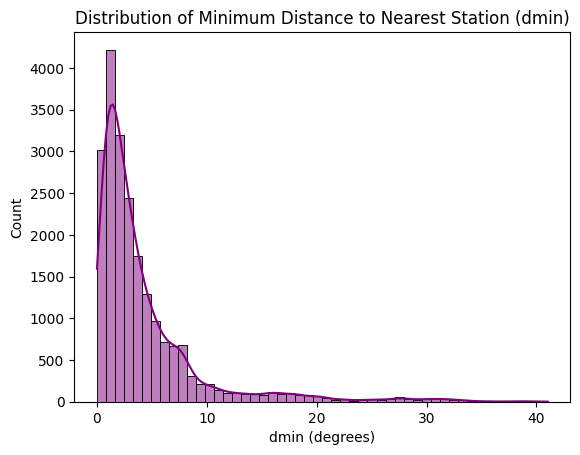

In [42]:
sns.histplot(earthquake_data['dmin'].dropna(), bins=50, kde=True, color='purple')
plt.title("Distribution of Minimum Distance to Nearest Station (dmin)")
plt.xlabel("dmin (degrees)")
plt.show()

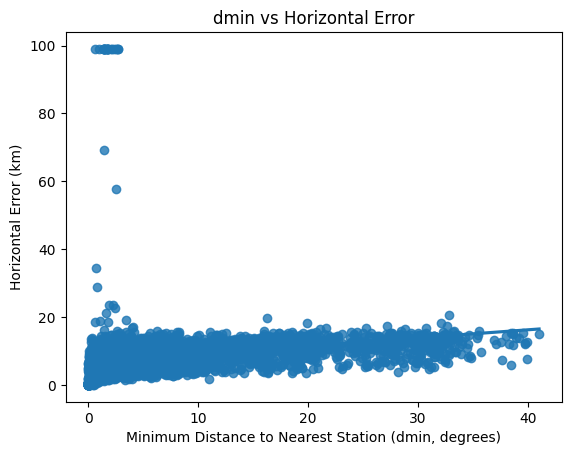

In [43]:
subset = earthquake_data.dropna(subset=['dmin', 'horizontalError'])

sns.regplot(x='dmin', y='horizontalError', data=subset)
plt.title("dmin vs Horizontal Error")
plt.xlabel("Minimum Distance to Nearest Station (dmin, degrees)")
plt.ylabel("Horizontal Error (km)")
plt.show()

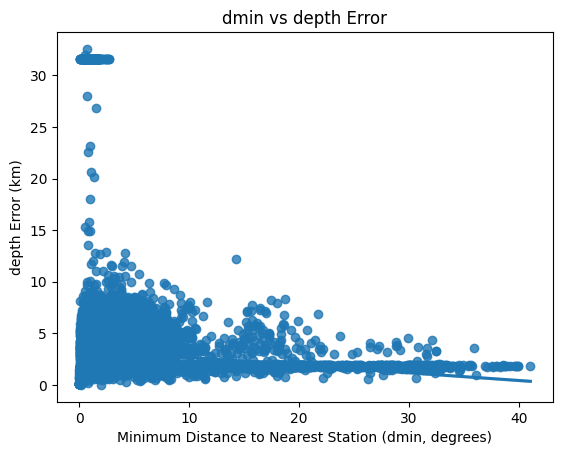

In [44]:
subset = earthquake_data.dropna(subset=['dmin', 'depthError'])

sns.regplot(x='dmin', y='depthError', data=subset)
plt.title("dmin vs depth Error")
plt.xlabel("Minimum Distance to Nearest Station (dmin, degrees)")
plt.ylabel("depth Error (km)")
plt.show()

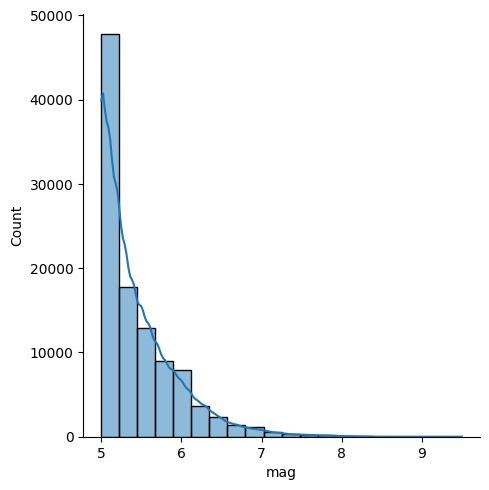

In [45]:

sns.displot(data=earthquake_data,x="mag",bins=20,kde=True)
plt.show()

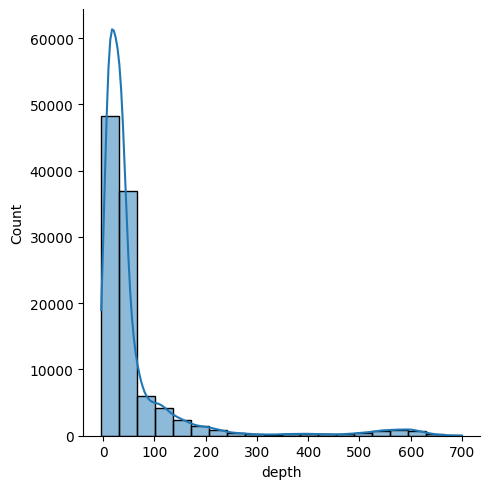

In [46]:

sns.displot(data=earthquake_data,x="depth",bins=20,kde=True)
plt.show()

In [47]:
import plotly.express as px

fig = px.scatter_geo(
    earthquake_data,
    lat='latitude',
    lon='longitude',
    size='mag',        
    color='depth',     
    hover_name='place',
    projection='natural earth',
    title='Earthquake Locations'
)
fig.show()

In [48]:
import plotly.express as px

earthquake_data['weight'] = earthquake_data['mag'] / (earthquake_data['depth'] + 1)  

fig = px.density_mapbox(
    earthquake_data, 
    lat='latitude', 
    lon='longitude', 
    z='weight',
    radius=10,  
    center=dict(lat=0, lon=0), 
    zoom=0,   
    mapbox_style='carto-positron',
    title='Global Earthquake Hotspots Weighted by Magnitude & Depth'
)

fig.show()
